<a href="https://colab.research.google.com/github/Ravitejac6/EIP-Assignment4/blob/master/Assignment4B_GradCam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from skimage import io
from keras import backend as K
from keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions
from keras.preprocessing import image
import numpy as np
import cv2

Using TensorFlow backend.


In [0]:
#!pip install keract

In [0]:

model = VGG16(weights="imagenet")
def process_image(url):
  img = io.imread(url)
  img = cv2.resize(img, dsize=(224, 224), interpolation=cv2.INTER_CUBIC)
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = preprocess_input(x)

  #predict
  preds = model.predict(x)
  class_idx = np.argmax(preds[0])
  print(class_idx)
  class_output = model.output[:, class_idx]
  last_conv_layer = model.get_layer("block5_conv3")

  
  grads = K.gradients(class_output, last_conv_layer.output)[0]
  print(grads.shape)
  pooled_grads = K.mean(grads, axis=(0, 1, 2))
  print(pooled_grads.shape)
  iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

  pooled_grads_value, conv_layer_output_value = iterate([x])

  for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

  #heat map
  heatmap = np.mean(conv_layer_output_value, axis = -1)
  print(conv_layer_output_value.shape)
  print(heatmap.shape)
  heatmap = np.maximum(heatmap, 0)
  heatmap /= np.max(heatmap)
  
  #display
  heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
  heatmap = np.uint8(255 * heatmap)
  heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
  superimposed_img = cv2.addWeighted(img, 0.5, heatmap, 0.5, 0)
  from google.colab.patches import cv2_imshow
  cv2_imshow(img)
  cv2_imshow(superimposed_img)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.




153
(?, 14, 14, 512)
(512,)
(14, 14, 512)
(14, 14)


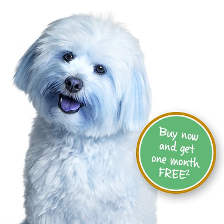

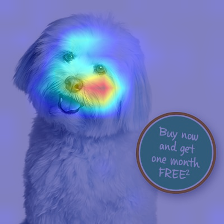

In [0]:
process_image("https://www.rspcapetinsurance.org.au/rspca/media/images/hero/dog-insurance-hero.jpg")

281
(?, 14, 14, 512)
(512,)
(14, 14, 512)
(14, 14)


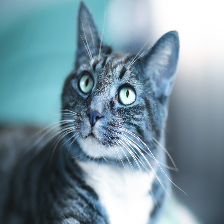

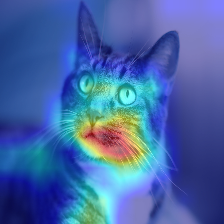

In [0]:
process_image("https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fcbsnews1.cbsistatic.com%2Fhub%2Fi%2F2014%2F04%2F15%2F4ea65e0b-4b11-43d8-9751-1a52f7a9fc3a%2Fcat-istock-000025213483.jpg&f=1&nofb=1")

568
(?, 14, 14, 512)
(512,)
(14, 14, 512)
(14, 14)


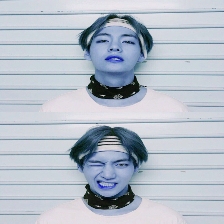

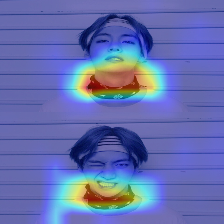

In [0]:
process_image("https://external-content.duckduckgo.com/iu/?u=http%3A%2F%2Fimg.kpopmap.com%2Fwp-content%2Fuploads_kpopmap%2F2017%2F04%2FV_bts_2.jpg&f=1&nofb=1")

819
(?, 14, 14, 512)
(512,)
(14, 14, 512)
(14, 14)


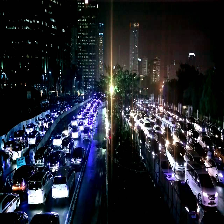

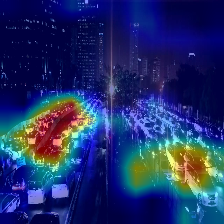

In [0]:
process_image("https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fi.ytimg.com%2Fvi%2FoB1LOhhzLWY%2Fmaxresdefault.jpg&f=1&nofb=1")

979
(?, 14, 14, 512)
(512,)
(14, 14, 512)
(14, 14)


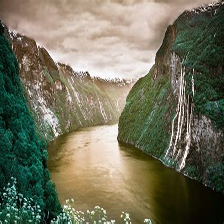

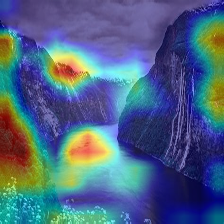

In [0]:
process_image("https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Ftse4.mm.bing.net%2Fth%3Fid%3DOIP.QhFfPYuahFhjg4UnkcAp4QHaEK%26pid%3DApi&f=1")

24
(?, 14, 14, 512)
(512,)
(14, 14, 512)
(14, 14)


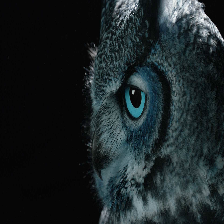

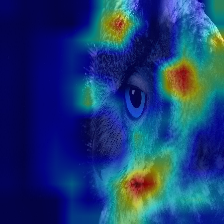

In [0]:
process_image("https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fwww.cbc.ca%2Fnatureofthings%2Fcontent%2Fimages%2Fepisodes%2Fsecretlifeofowls_1920.jpg&f=1&nofb=1")

788
(?, 14, 14, 512)
(512,)
(14, 14, 512)
(14, 14)


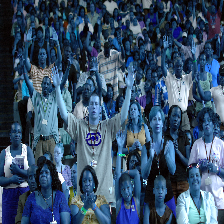

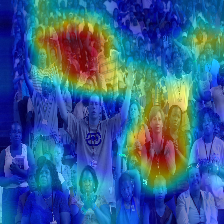

In [0]:
process_image("https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fww1.prweb.com%2Fprfiles%2F2006%2F07%2F24%2F0000415882%2FCrowd.jpg&f=1&nofb=1")

921
(?, 14, 14, 512)
(512,)
(14, 14, 512)
(14, 14)


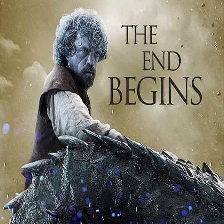

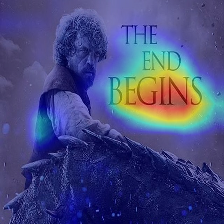

In [0]:
process_image("https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fc.tribune.com.pk%2F2017%2F07%2F1456846-got-1499922339-581-640x480.jpg&f=1&nofb=1")

7
(?, 14, 14, 512)
(512,)
(14, 14, 512)
(14, 14)


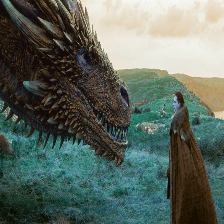

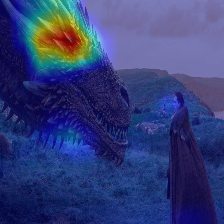

In [0]:
process_image("https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fscreenrant.com%2Fwp-content%2Fuploads%2F2017%2F08%2FJon-Snow-Kit-Harrington-meets-Drogon-on-Game-of-Thrones.jpg&f=1&nofb=1")

250
(?, 14, 14, 512)
(512,)
(14, 14, 512)
(14, 14)


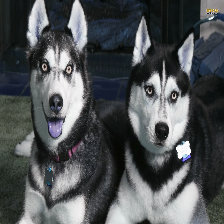

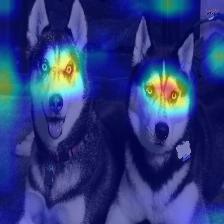

In [0]:
process_image("https://external-content.duckduckgo.com/iu/?u=http%3A%2F%2F1.bp.blogspot.com%2F-fSe-aJBUwNg%2FUpR3P9KPpDI%2FAAAAAAAALtg%2FUtiGe3j08jE%2Fs1600%2FSiberian-Husky-2.jpg&f=1&nofb=1")

In [0]:
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import decode_predictions
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing.image import img_to_array

model = VGG16()

from PIL import Image
import requests
from io import BytesIO

#url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/1/14/Gatto_europeo4.jpg/250px-Gatto_europeo4.jpg'
url = 'https://external-content.duckduckgo.com/iu/?u=http%3A%2F%2F1.bp.blogspot.com%2F-fSe-aJBUwNg%2FUpR3P9KPpDI%2FAAAAAAAALtg%2FUtiGe3j08jE%2Fs1600%2FSiberian-Husky-2.jpg&f=1&nofb=1'
response = requests.get(url)
img = Image.open(BytesIO(response.content))
img = img.crop((0, 0, 224, 224))
img = img_to_array(img)   
#c(1, dim(x))                 
img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))
img = preprocess_input(img)
yhat = model.predict(img)
label = decode_predictions(yhat)
label = label[0][0]
print('{} ({})'.format(label[1], label[2] * 100))



skunk (10.036996006965637)


In [0]:
import keract

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])


In [0]:
img.shape

(1, 224, 224, 3)

In [0]:
activations = keract.get_activations(model,img)


input_2:0 (224, 224, 3) -> Skipped. First dimension is not 1.
block1_conv1_1/Relu:0 (1, 224, 224, 64) 


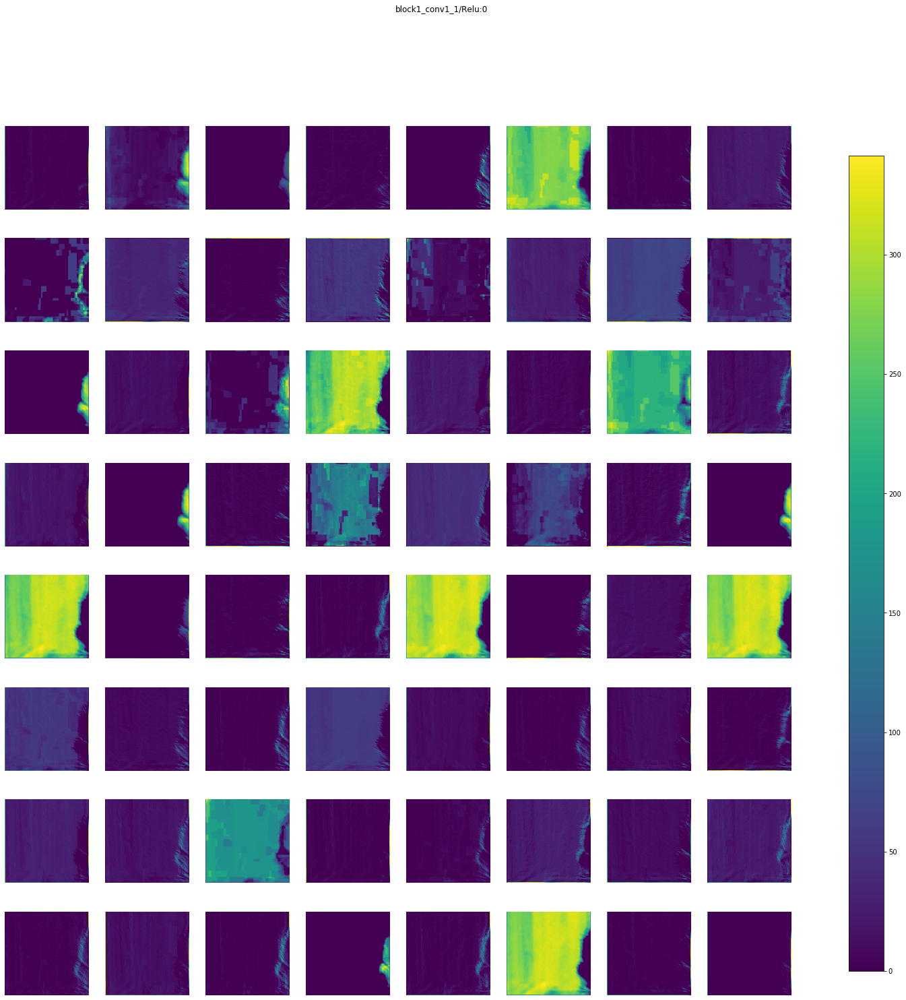

block1_conv2_1/Relu:0 (1, 224, 224, 64) 


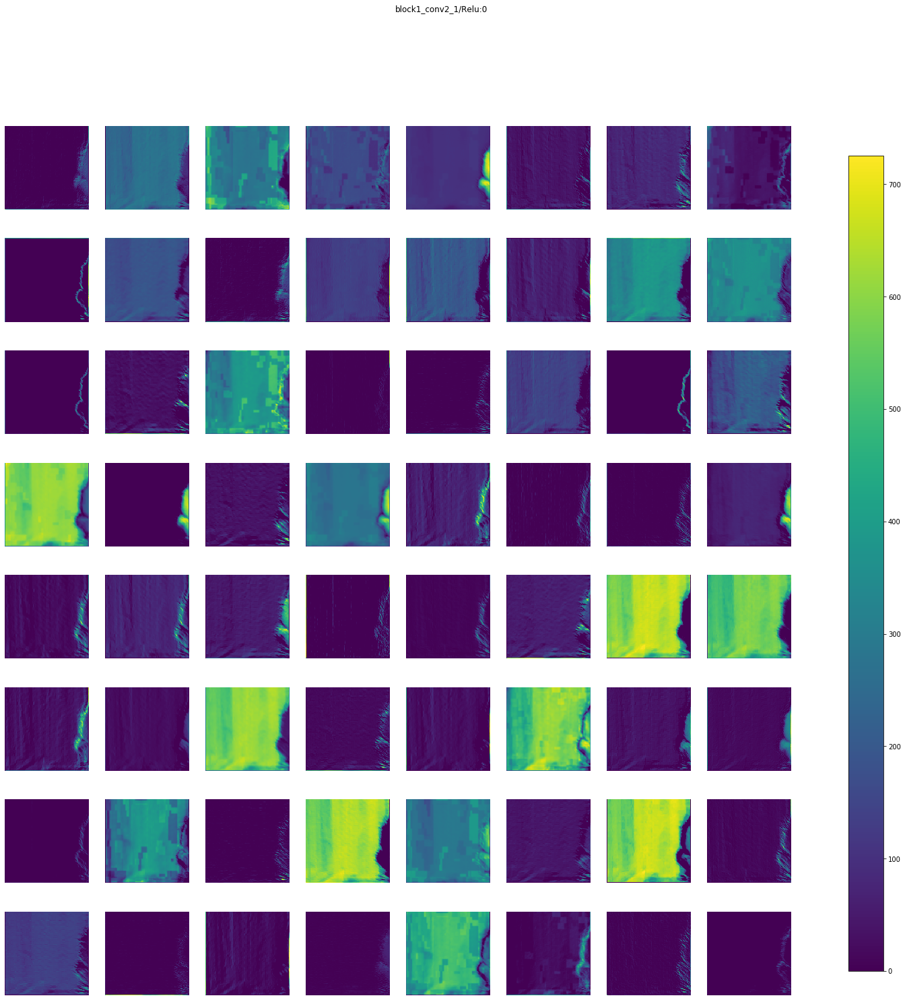

block1_pool_1/MaxPool:0 (1, 112, 112, 64) 


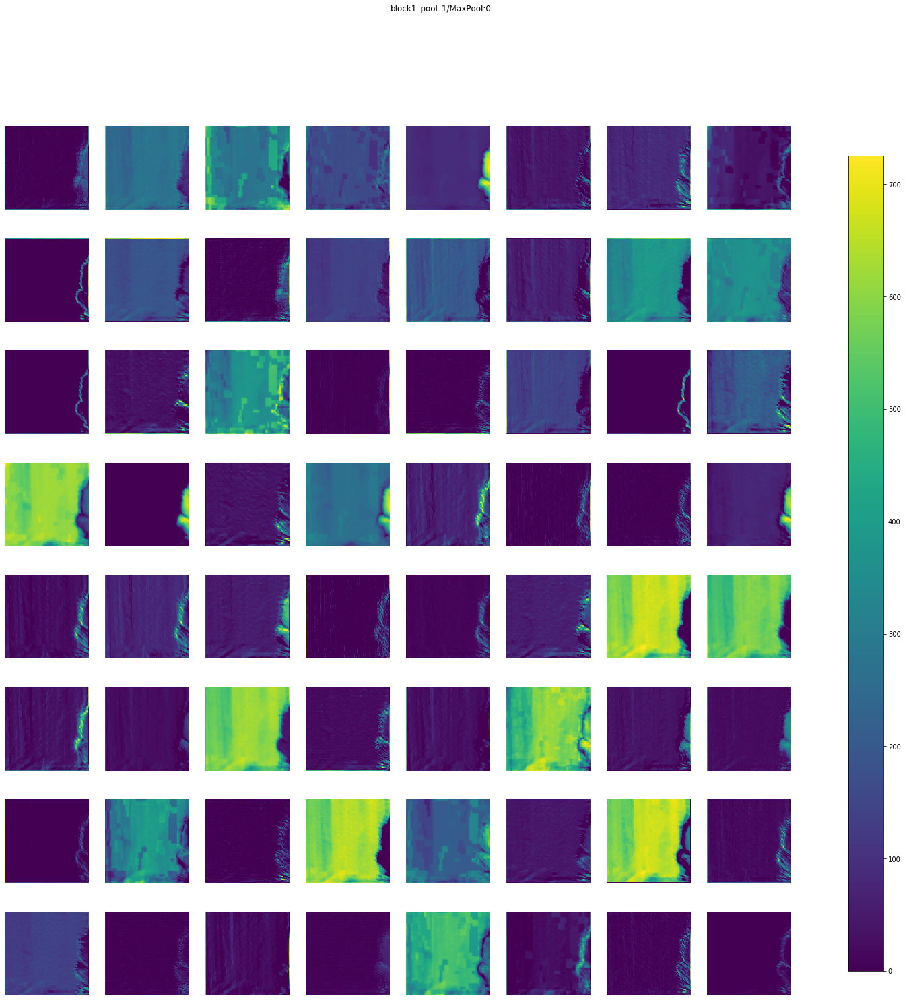

block2_conv1_1/Relu:0 (1, 112, 112, 128) 


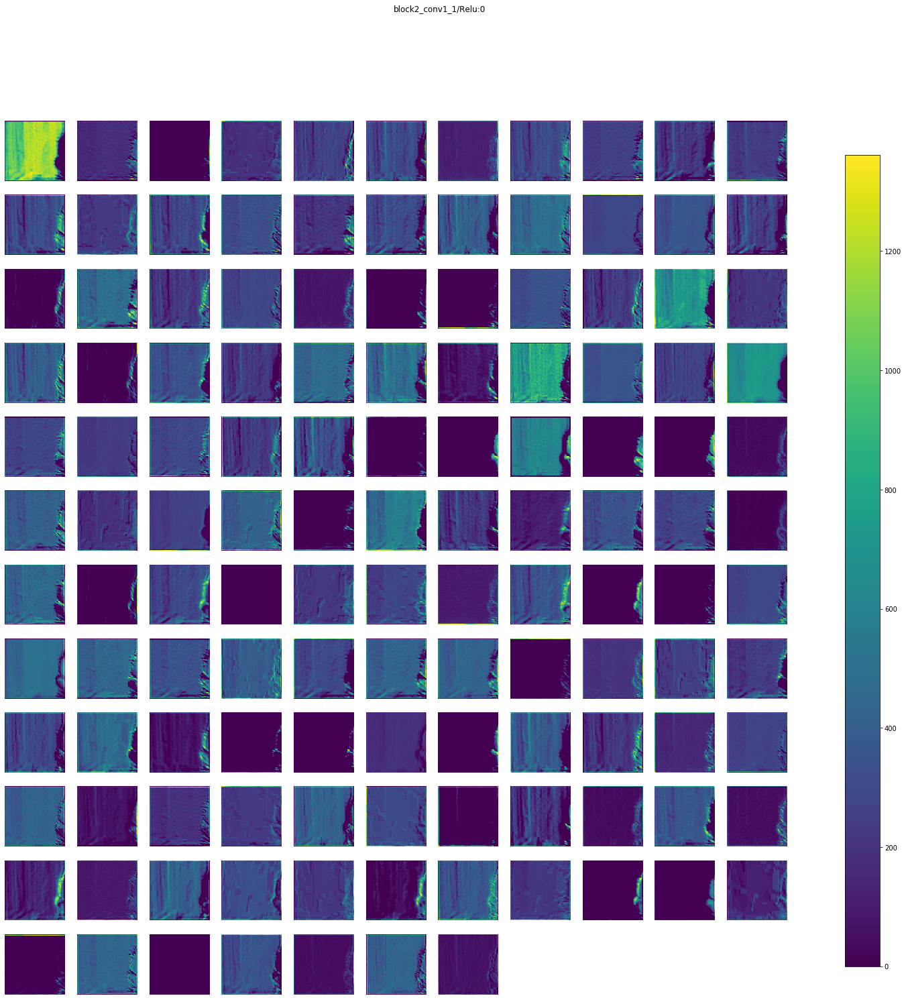

block2_conv2_1/Relu:0 (1, 112, 112, 128) 


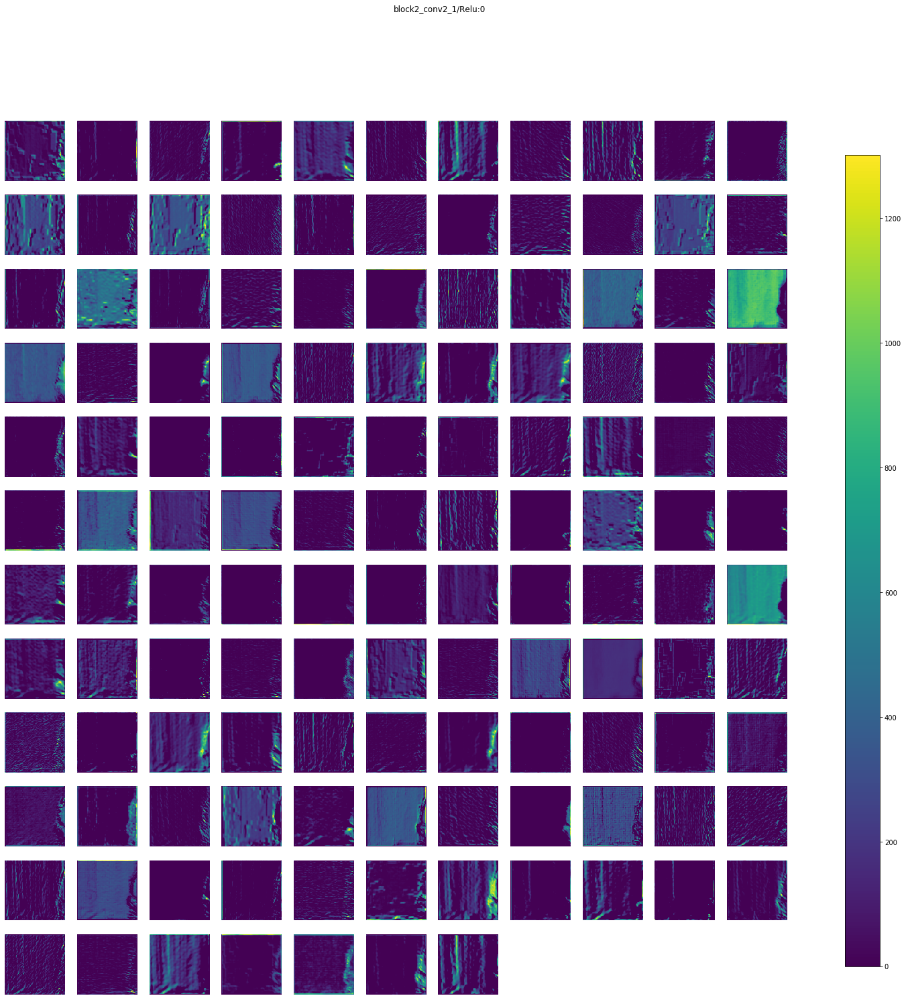

block2_pool_1/MaxPool:0 (1, 56, 56, 128) 


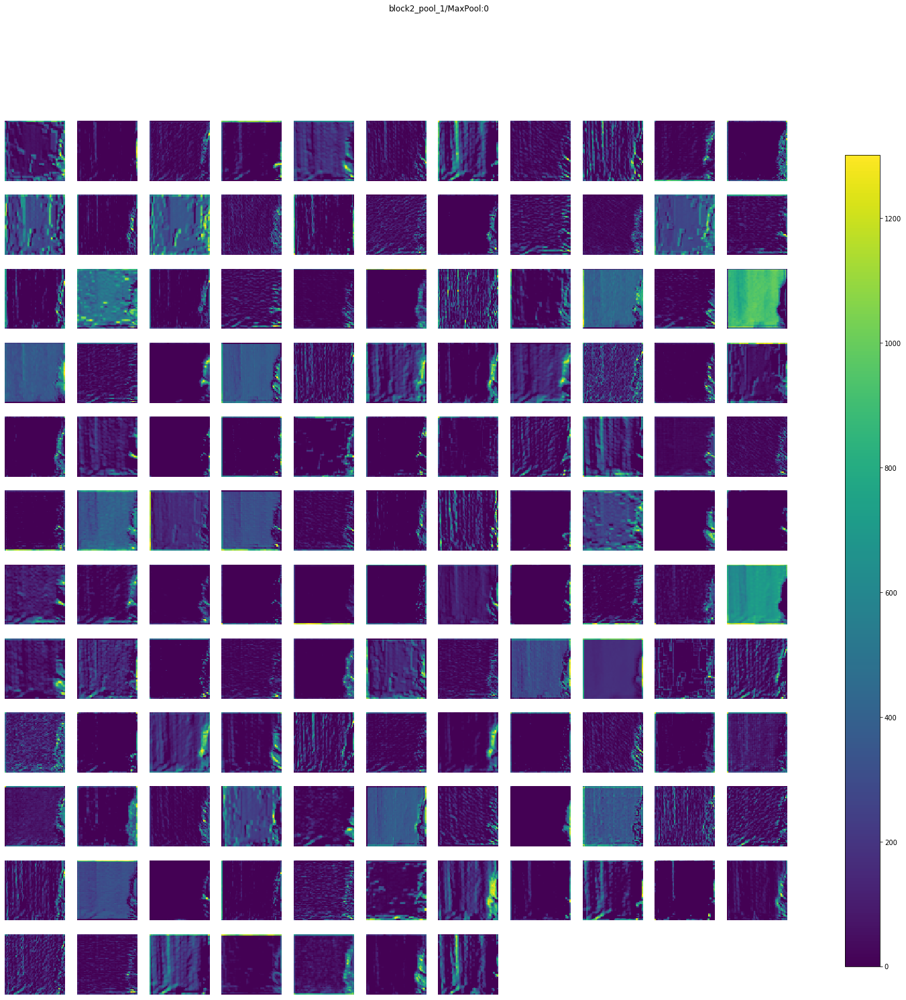

block3_conv1_1/Relu:0 (1, 56, 56, 256) 


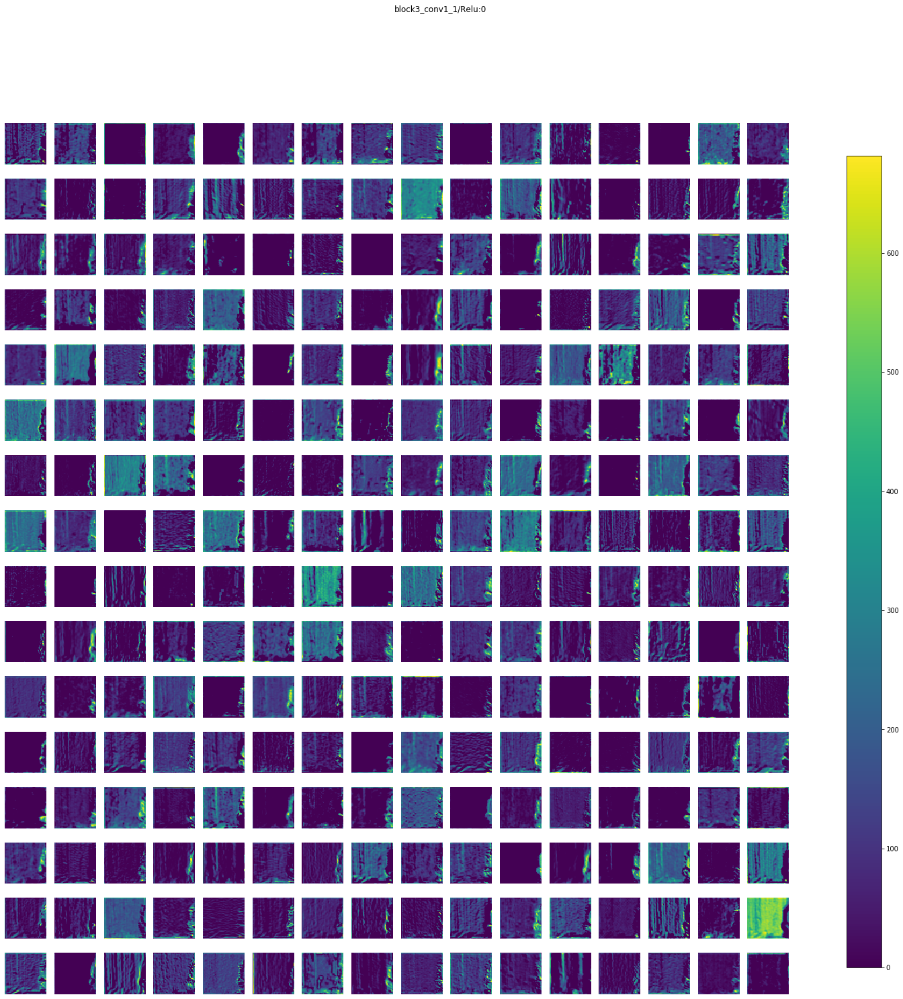

block3_conv2_1/Relu:0 (1, 56, 56, 256) 


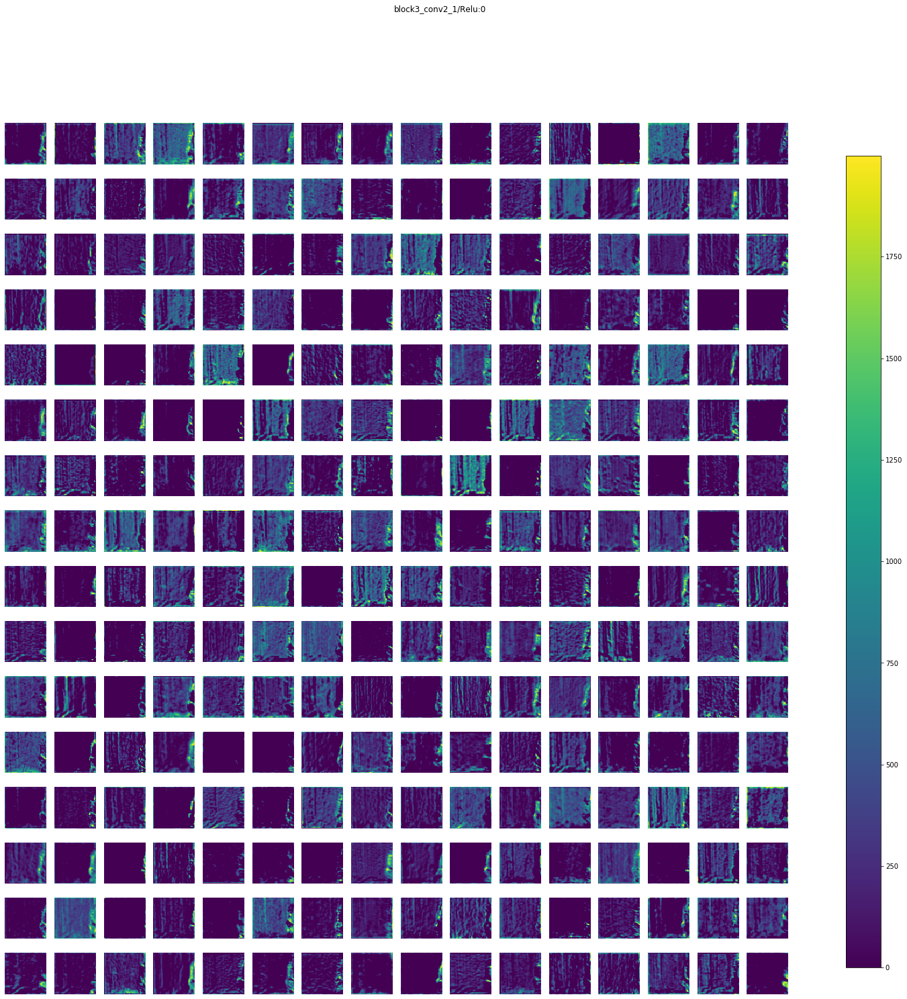

block3_conv3_1/Relu:0 (1, 56, 56, 256) 


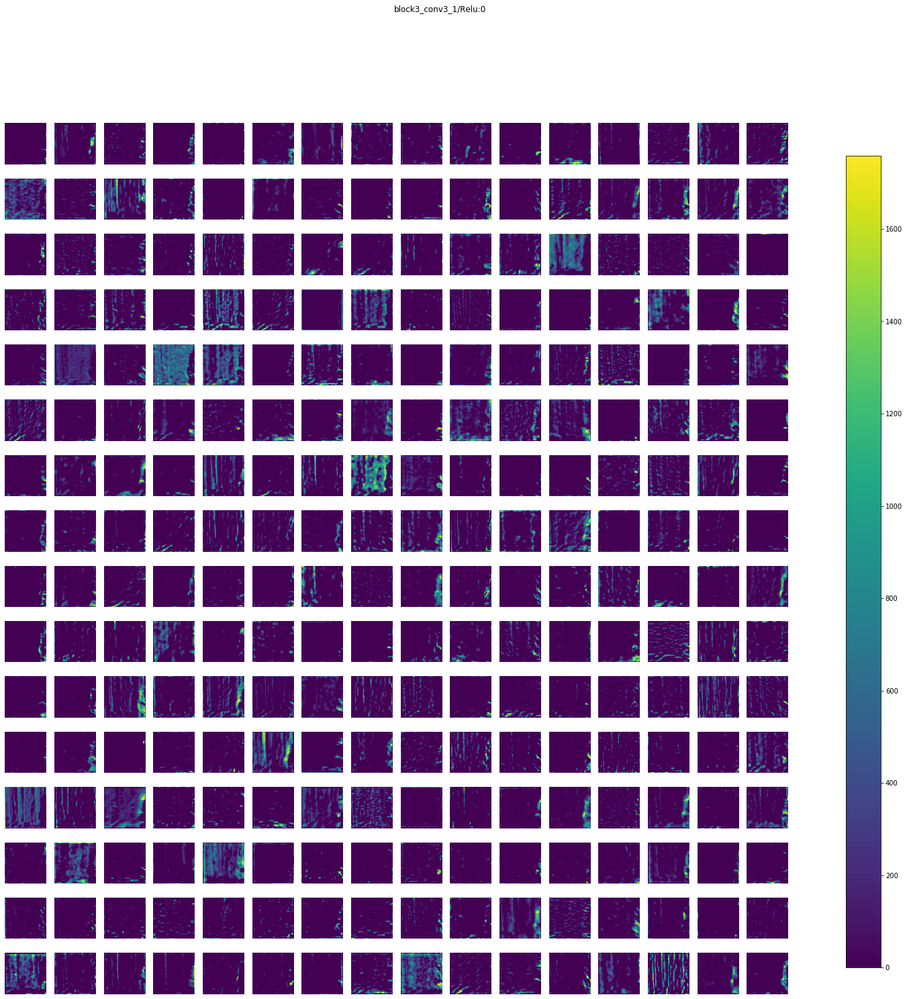

block3_pool_1/MaxPool:0 (1, 28, 28, 256) 


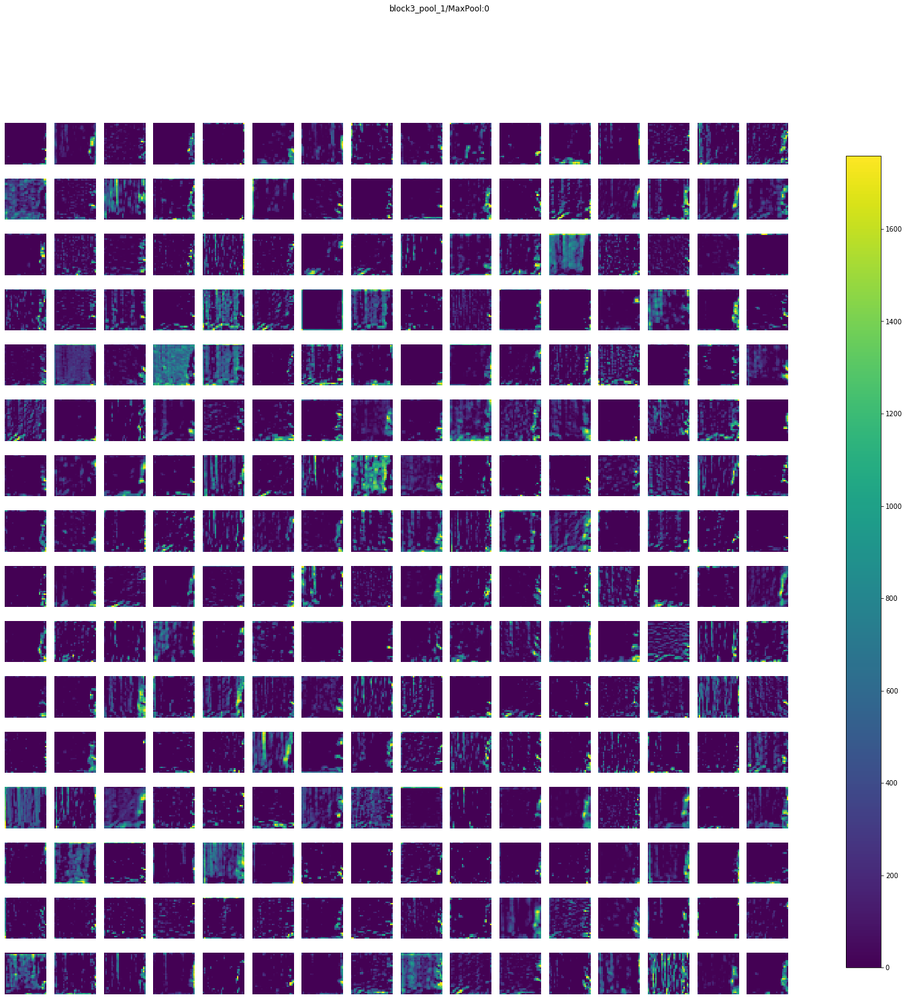

block4_conv1_1/Relu:0 (1, 28, 28, 512) 


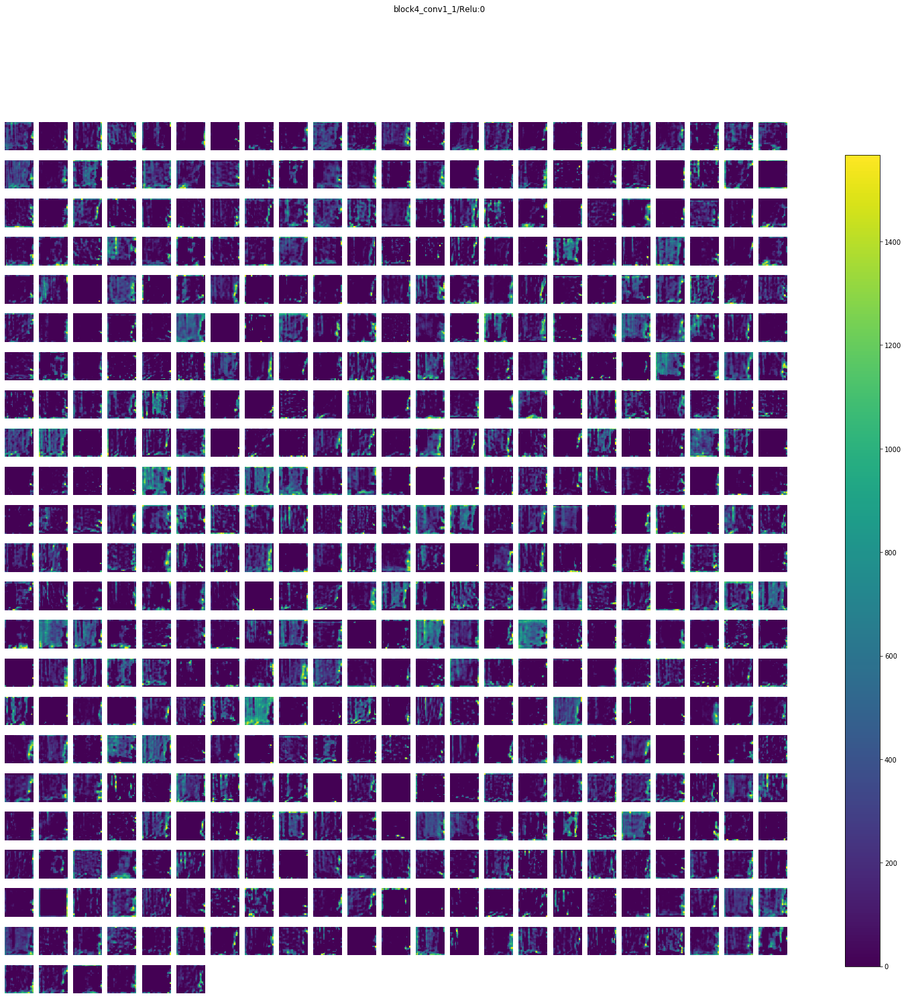

block4_conv2_1/Relu:0 (1, 28, 28, 512) 


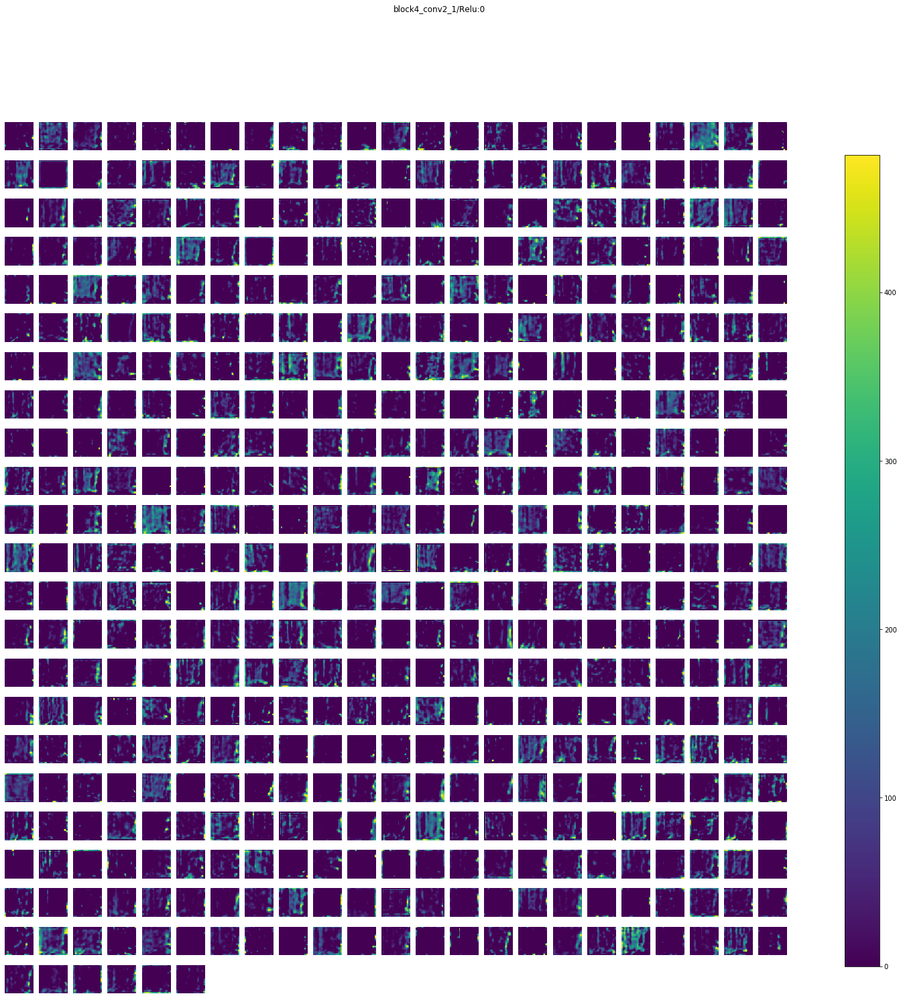

block4_conv3_1/Relu:0 (1, 28, 28, 512) 


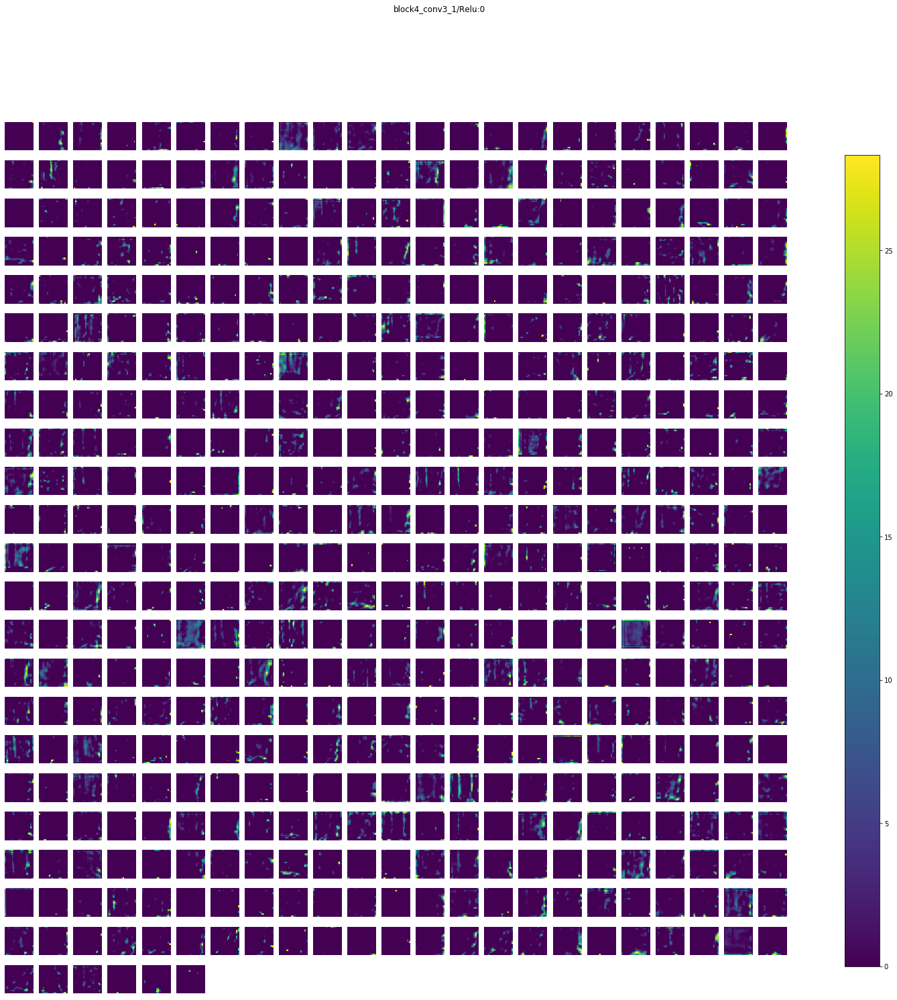

block4_pool_1/MaxPool:0 (1, 14, 14, 512) 


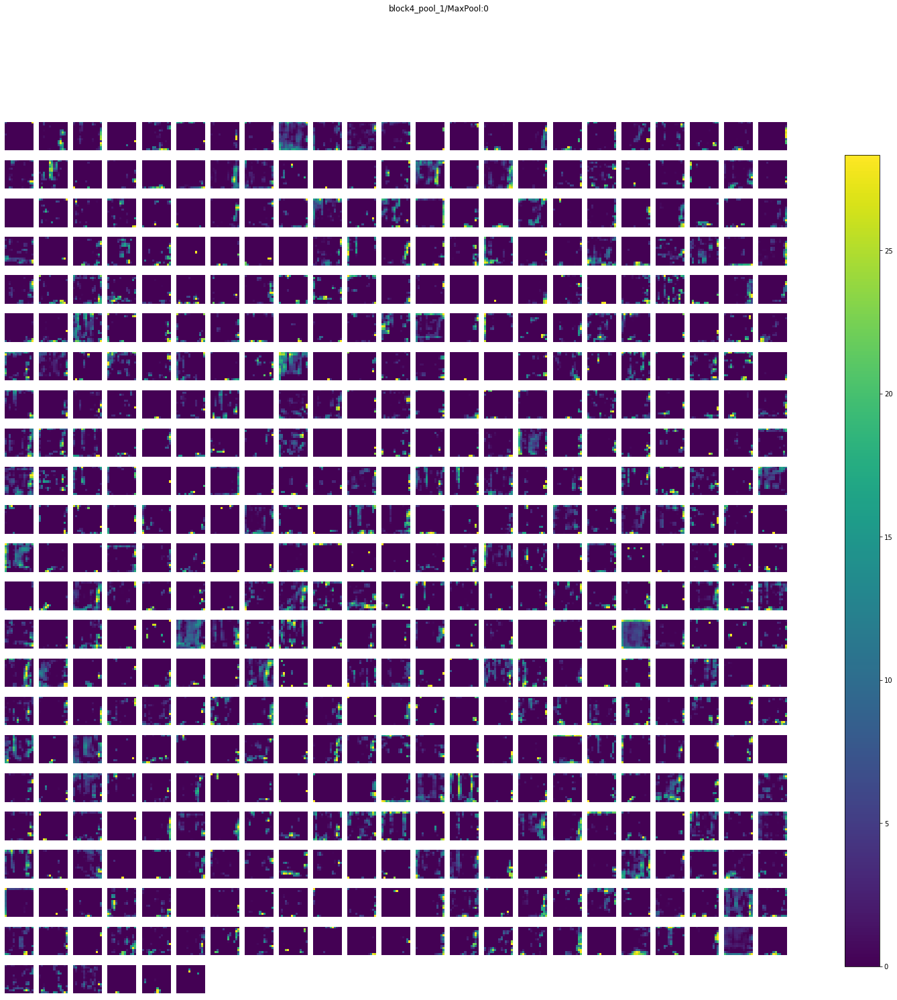

block5_conv1_1/Relu:0 (1, 14, 14, 512) 


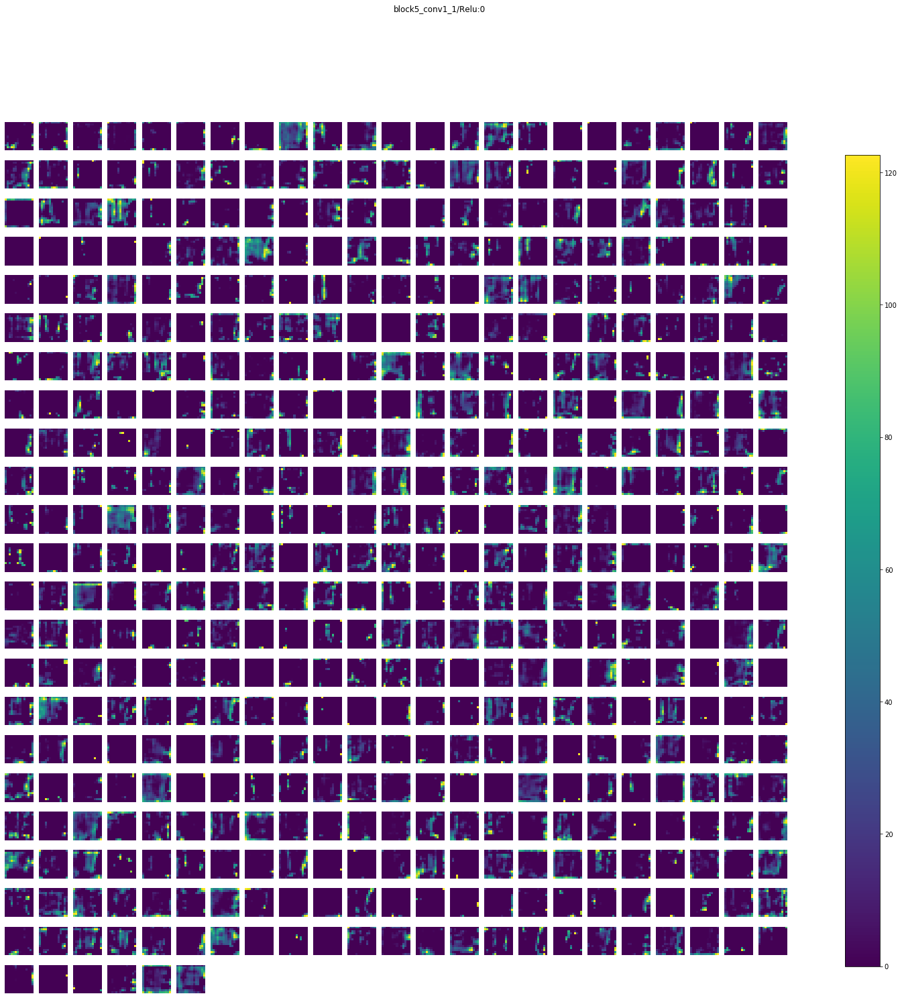

block5_conv2_1/Relu:0 (1, 14, 14, 512) 


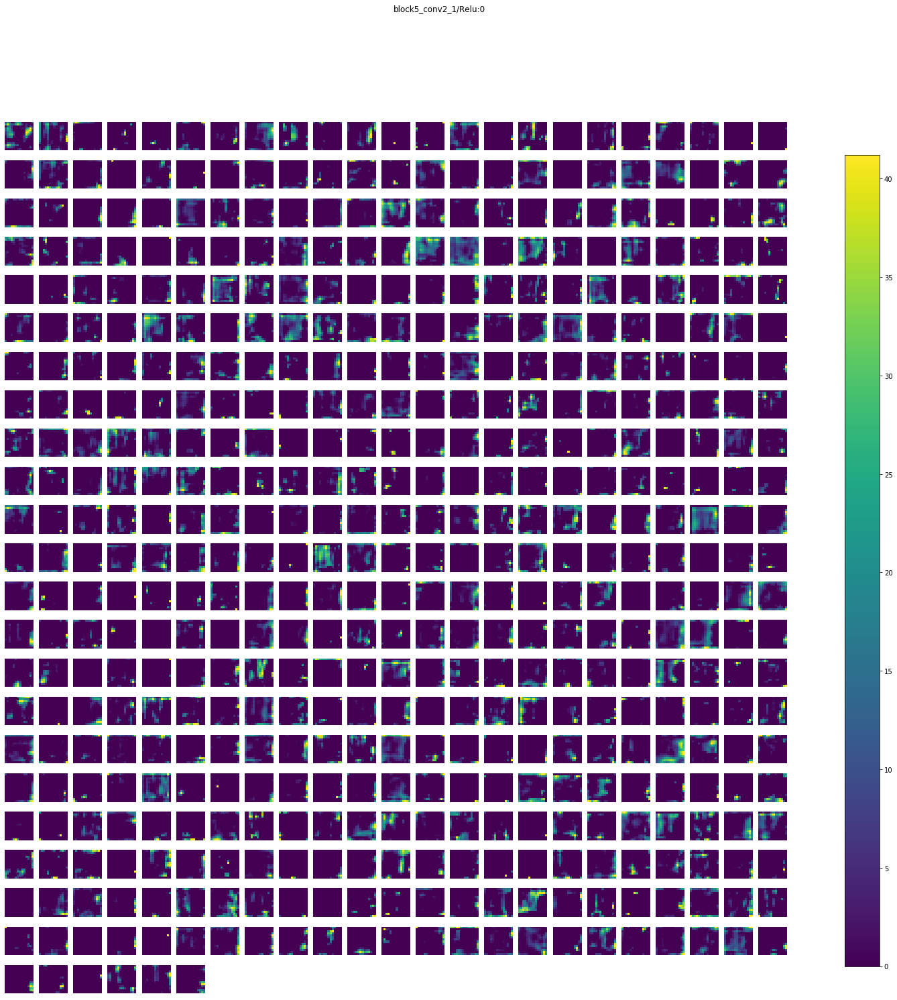

block5_conv3_1/Relu:0 (1, 14, 14, 512) 


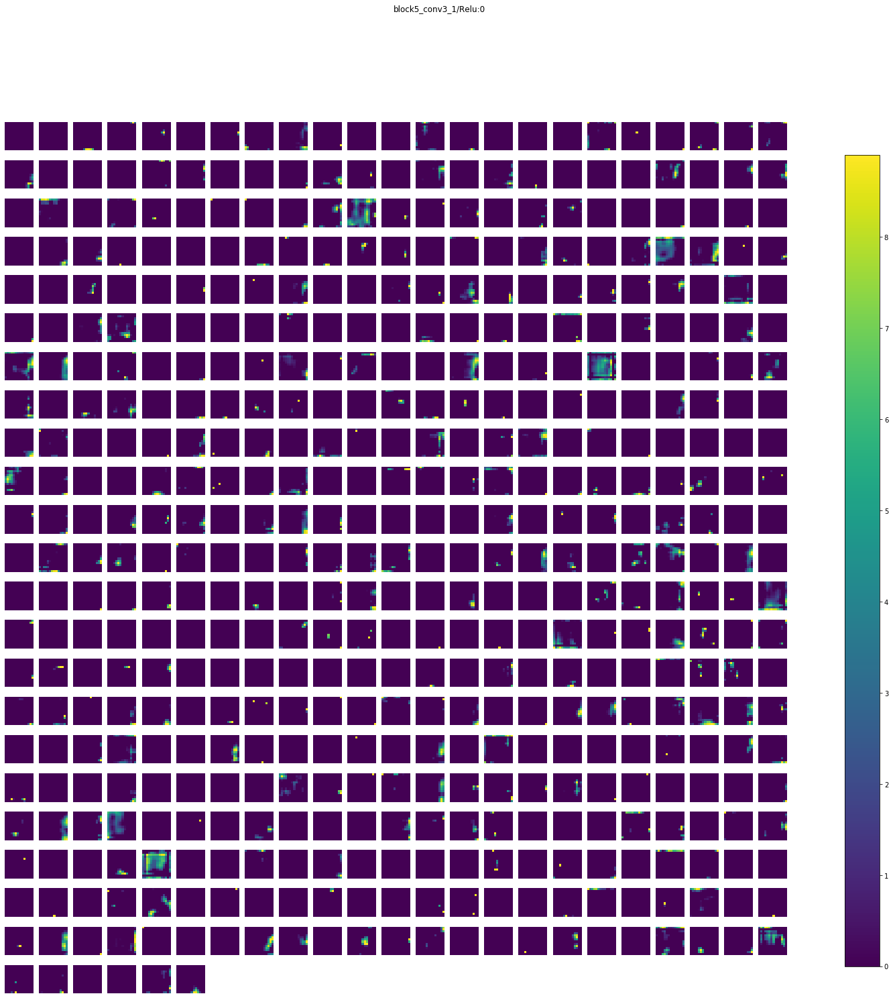

block5_pool_1/MaxPool:0 (1, 7, 7, 512) 


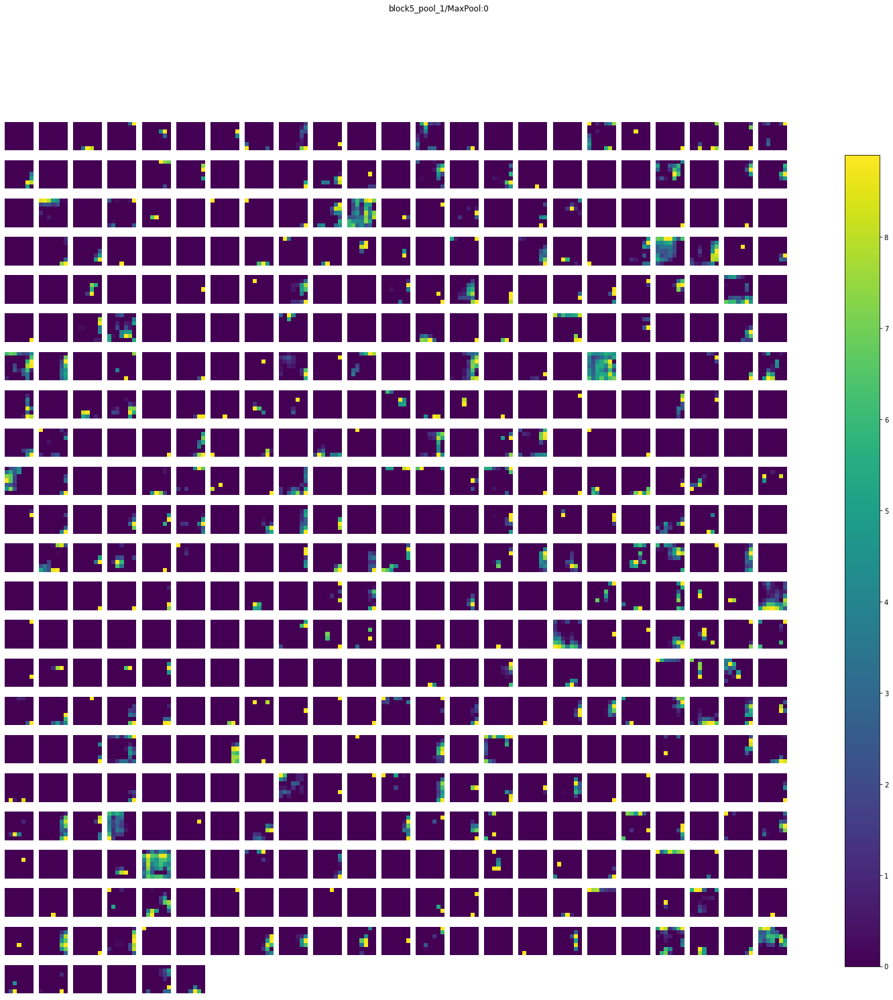

flatten_1/Reshape:0 (1, 25088) 


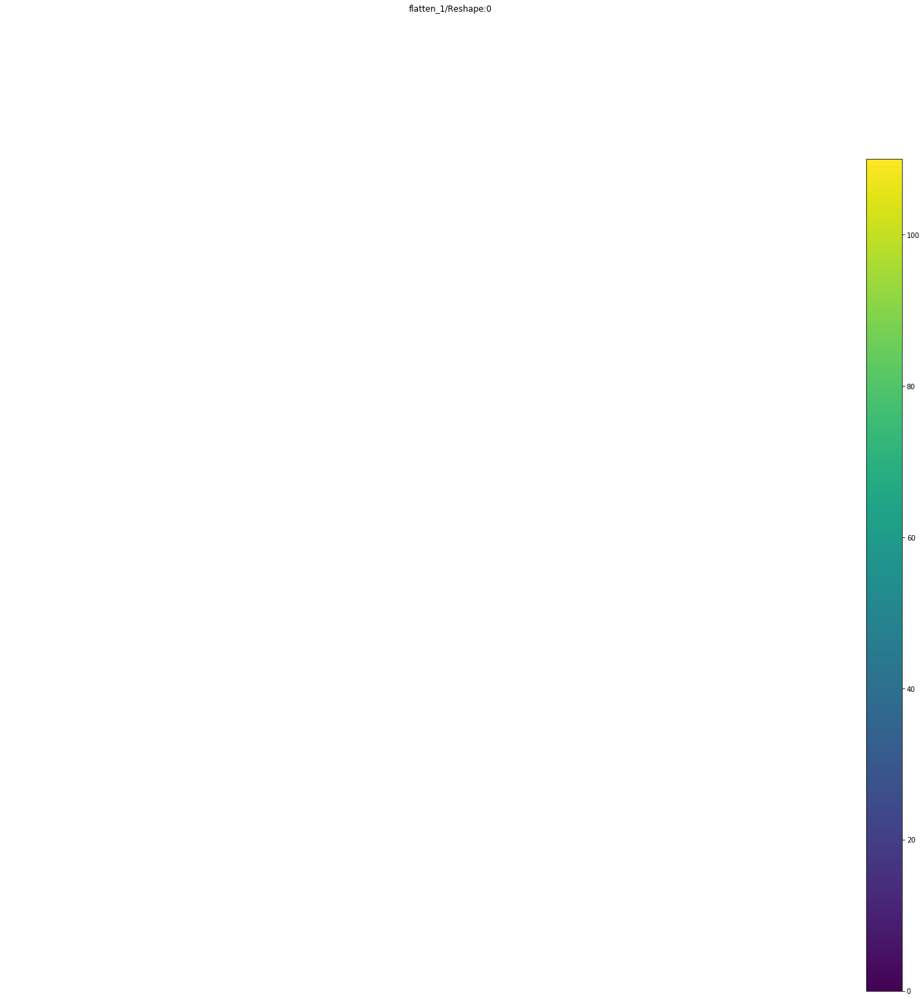

fc1_1/Relu:0 (1, 4096) 


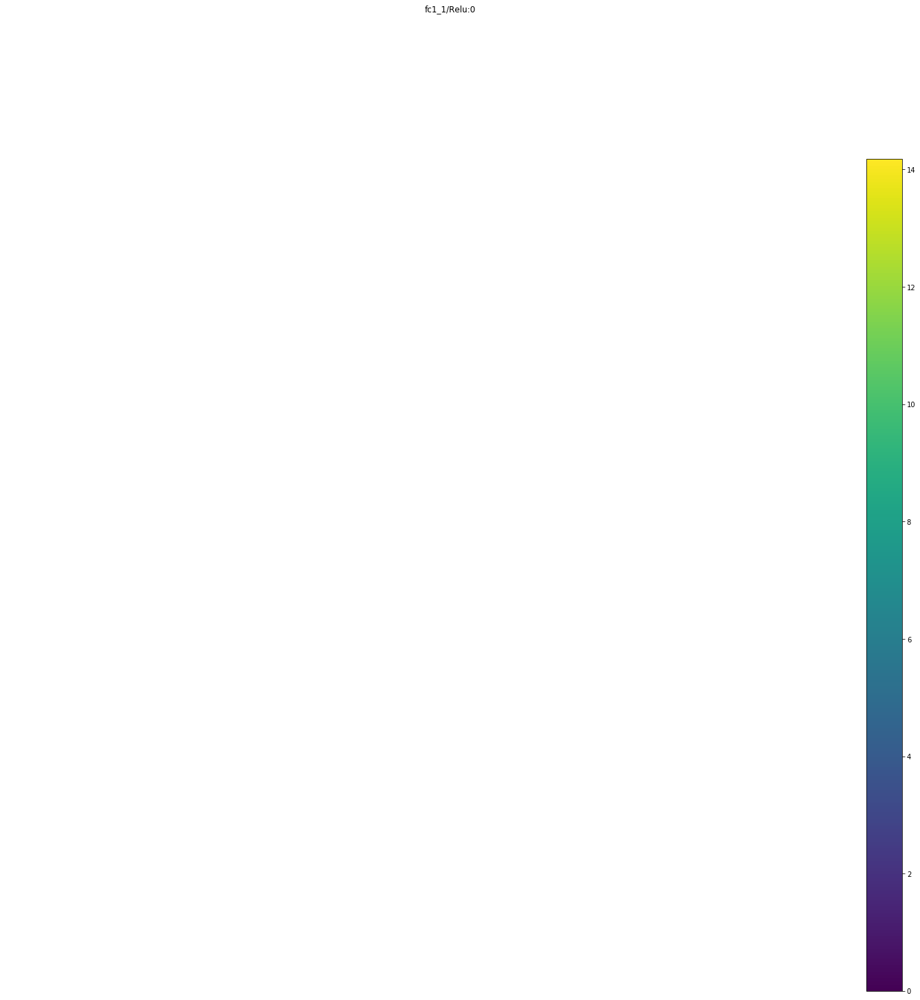

fc2_1/Relu:0 (1, 4096) 


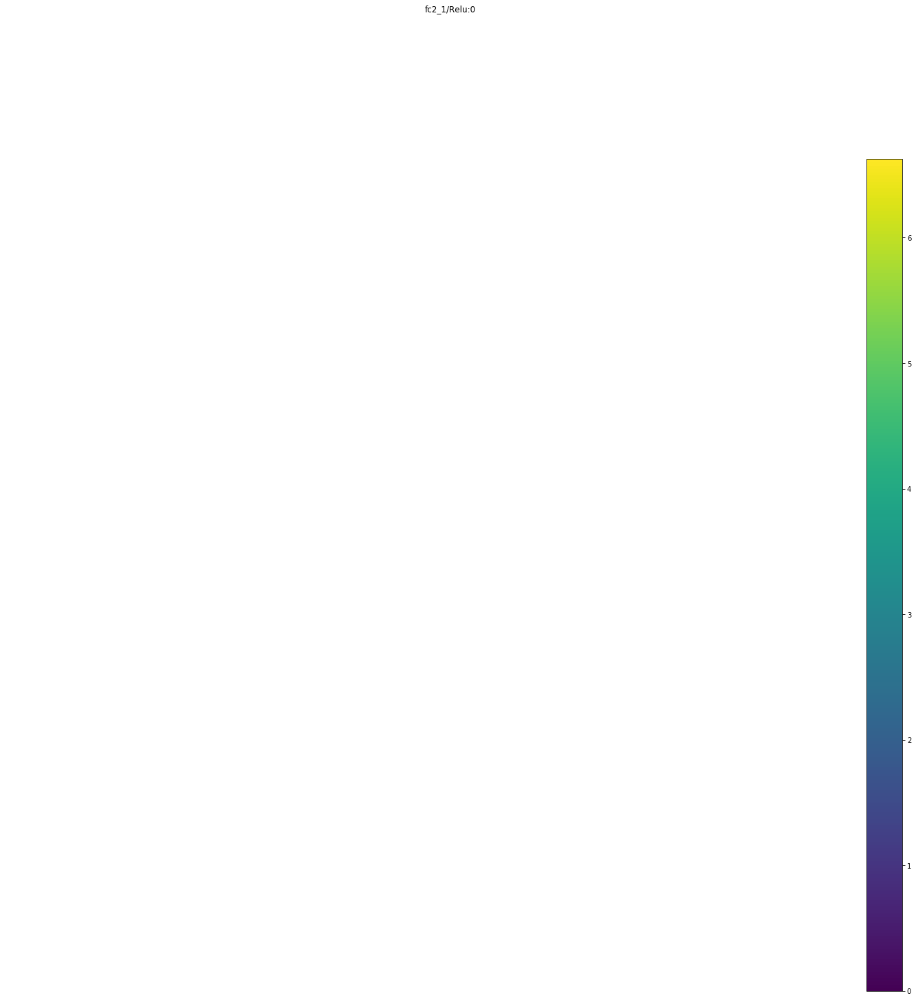

predictions_1/Softmax:0 (1, 1000) 


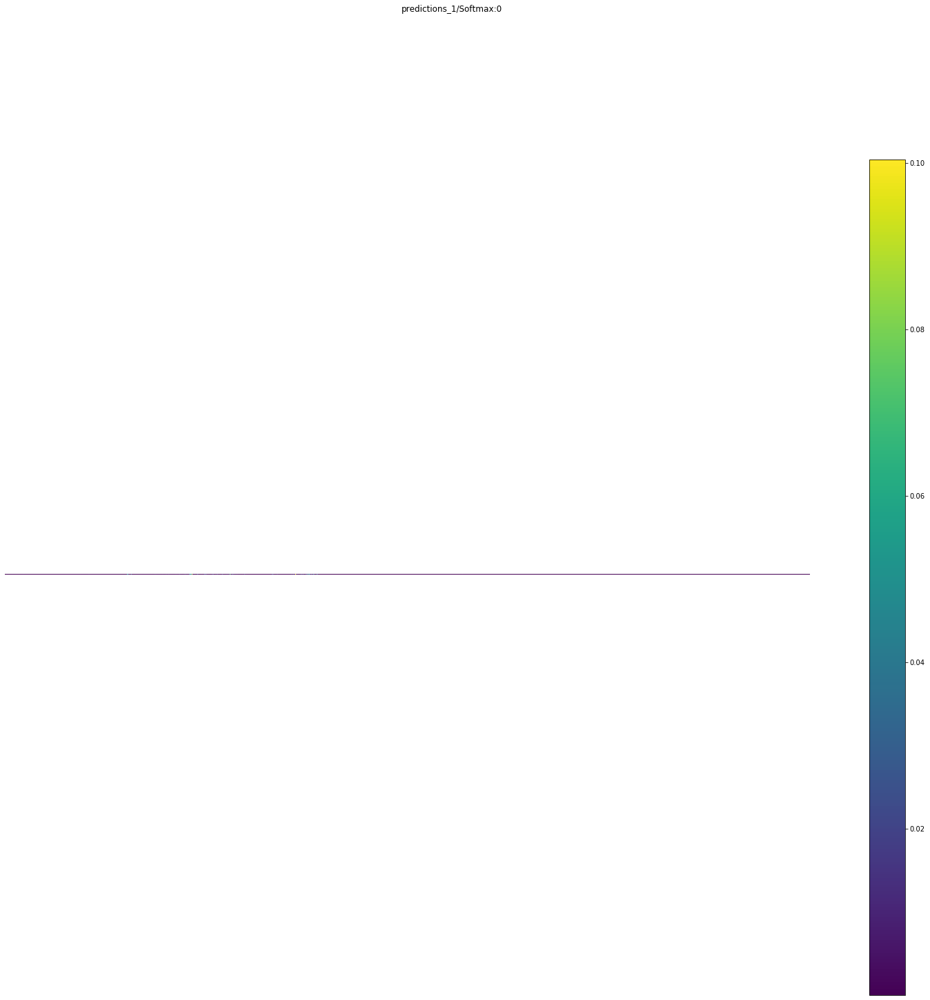

In [0]:
first = activations.get('block1_conv1/Relu:0')
keract.display_activations(activations)